In [86]:
# Implementation of CycleGAN Network

In [87]:
# For importing Generator & Discriminator, We need to install tensorflow_examples
!pip install git+https://github.com/tensorflow/examples.git

  Cloning https://github.com/tensorflow/examples.git to /tmp/pip-req-build-ukw06oem
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/examples.git /tmp/pip-req-build-ukw06oem
  Resolved https://github.com/tensorflow/examples.git to commit 2741d0f2a345ef52e0de1d498de732f5dacbf2f0
  Preparing metadata (setup.py) ... done


In [88]:
import tensorflow as tf
tf.version.VERSION

'2.13.0'

In [89]:
import tensorflow_datasets as tfds
from tensorflow_examples.models.pix2pix import pix2pix

import os
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output

AUTOTUNE = tf.data.AUTOTUNE

In [90]:
# Download the CMP Facade Database data (30MB)
# Each original image is of size 256 x 512 containing two 256 x 256 images:
_URL = f'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/facades.tar.gz'

path_to_zip = tf.keras.utils.get_file(
    fname=f"facades.tar.gz",
    origin=_URL,
    extract=True)

In [91]:
path_to_zip

'/root/.keras/datasets/facades.tar.gz'

In [92]:
import pathlib
path_to_zip  = pathlib.Path(path_to_zip)
path_to_zip

PosixPath('/root/.keras/datasets/facades.tar.gz')

In [93]:
path_to_zip.parent

PosixPath('/root/.keras/datasets')

In [94]:
PATH = path_to_zip.parent/"facades"
PATH

PosixPath('/root/.keras/datasets/facades')

In [95]:
sample_image = tf.io.read_file(str(PATH / 'train/19.jpg'))
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)

(256, 512, 3)


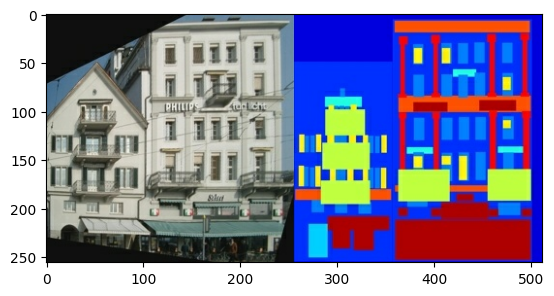

In [96]:
# We will need to separate real building facade images from the architecture label
# images, all of which will be of size 256 x 256.
plt.figure()
plt.imshow(sample_image)

In [97]:
# load image
def load(image_file):
  # Read and decode an image file to a uint8 tensor
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)

  # Split each image tensor into two tensors:
  # - one with a real building facade image
  # - one with an architecture label image
  w = tf.shape(image)[1]
  w = w // 2
  draw_image = image[:, w:, :]
  real_image = image[:, :w, :]

  # Convert both images to float32 tensors
  draw_image = tf.cast(draw_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return real_image, draw_image

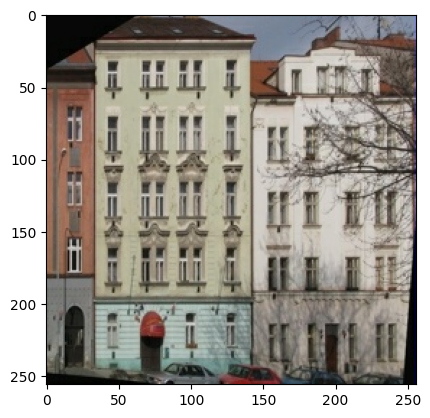

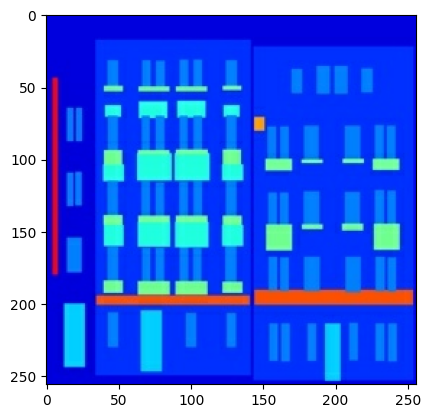

In [98]:
real, draw = load(str(PATH / 'train/101.jpg'))
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(real / 255.0)
plt.figure()
plt.imshow(draw / 255.0)

In [99]:
# The facade training set consist of 400 images
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net based Generator
BATCH_SIZE_PER_REPLICA = 1

# When training a model with multiple GPUs, you can use the extra computing power
# effectively by increasing the batch size. In general, use the largest batch size
# that fits the GPU memory and tune the learning rate accordingly.
BATCH_SIZE = BATCH_SIZE_PER_REPLICA * 1 # strategy.num_replicas_in_sync

# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [100]:
def resize(real_image, draw_image, height, width):
  draw_image = tf.image.resize(draw_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return real_image, draw_image

In [101]:
def random_crop(real_image, draw_image):
  stacked_image = tf.stack([real_image, draw_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [102]:
# Normalizing the images to [-1, 1]
def normalize(real_image, draw_image):
  draw_image = (draw_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return real_image, draw_image

In [103]:
@tf.function()
def random_jitter(real_image, draw_image):
  # In random jittering, the image is resized to 286 x 286 and
  # then randomly cropped to 256 x 256.
  real_image, draw_image = resize(real_image, draw_image, 286, 286)

  # Random cropping back to 256x256
  real_image, draw_image = random_crop(real_image, draw_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    draw_image = tf.image.flip_left_right(draw_image)
    real_image = tf.image.flip_left_right(real_image)

  return real_image, draw_image

In [104]:
# Get all the images file path
train_dataset = tf.data.Dataset.list_files(str(PATH / 'train/*.jpg'))

In [105]:
train_dataset

<_ShuffleDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>

In [106]:
# total number of images for training
len(train_dataset)

400

In [107]:
def load_image_train(image_file):
  real_image, draw_image = load(image_file)
  real_image, draw_image = random_jitter(real_image, draw_image)
  real_image, draw_image = normalize(real_image, draw_image)

  return real_image, draw_image

In [108]:
train_image_list = []
train_draw_list = []

In [109]:
for x in train_dataset.as_numpy_iterator():
  image, draw = load_image_train(x)
  train_image_list.append(image)
  train_draw_list.append(draw)

In [110]:
len(train_image_list)

400

In [111]:
# Create Dataset object for data input pipeline in Tensor
image_dataset_train = tf.data.Dataset.from_tensor_slices(train_image_list)
draw_dataset_train = tf.data.Dataset.from_tensor_slices(train_draw_list)

In [112]:
# creating tensorflow input pipeline for real houses as well as its architectural drawing
train_houses_real = image_dataset_train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

train_houses_draw = draw_dataset_train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [113]:
sample_real_house = next(iter(train_houses_real))
sample_draw_house = next(iter(train_houses_draw))

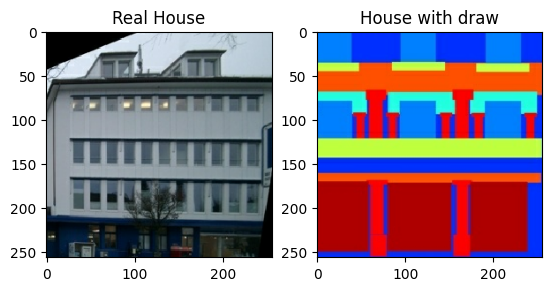

In [114]:
# Showing images to understand that there is no on-to-one mapping anymore
# random real house
plt.subplot(121)
plt.title('Real House')
plt.imshow(sample_real_house[0] * 0.5 + 0.5)

# random draw house
plt.subplot(122)
plt.title('House with draw')
plt.imshow((sample_draw_house[0]) * 0.5 + 0.5)

In [115]:
# model building
# The model architecture used in this tutorial is very similar to what was used
# in pix2pix. Some of the differences are:

# Cyclegan uses instance normalization instead of batch normalization.
# The CycleGAN paper uses a modified resnet based generator. But We will be using
# a modified unet generator for simplicity.

OUTPUT_CHANNELS = 3

# generator_g = image "real house" to image "architecture draw house"
# generator_f = image "architecture draw house" to image "real house"
generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

# discriminator_x = To differentiate b/w image "real house" and generated image "real house" (F(Y))
# discriminator_y = To differentiate b/w image "architecture draw house" and
# generated image "architecture draw house" (F(Y)) from real house.
discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

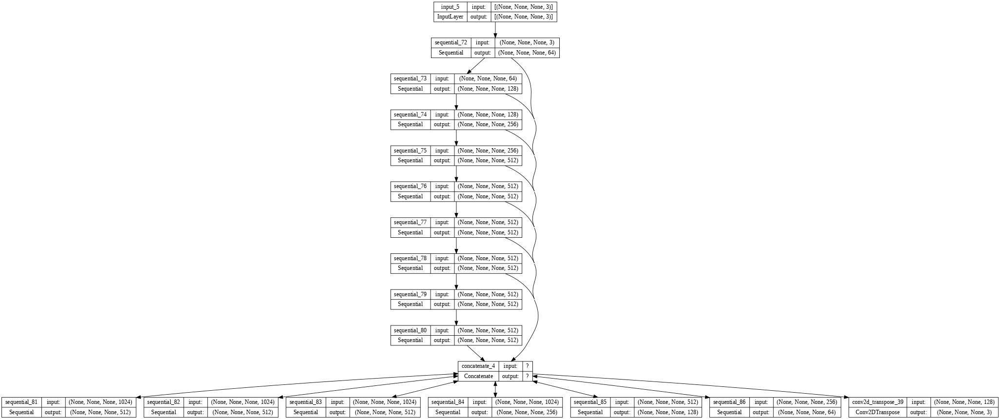

In [116]:
tf.keras.utils.plot_model(generator_g, show_shapes=True, dpi=64)

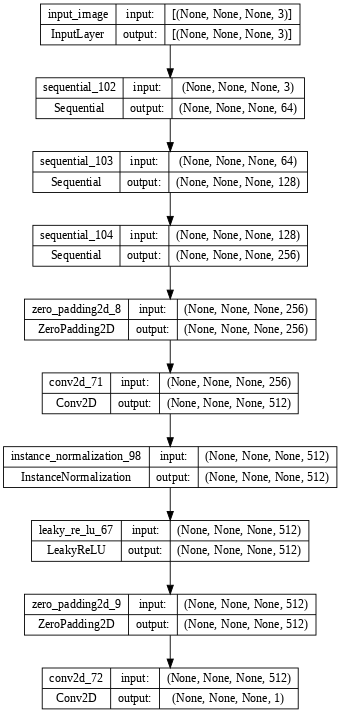

In [117]:
tf.keras.utils.plot_model(discriminator_x, show_shapes=True, dpi=64)

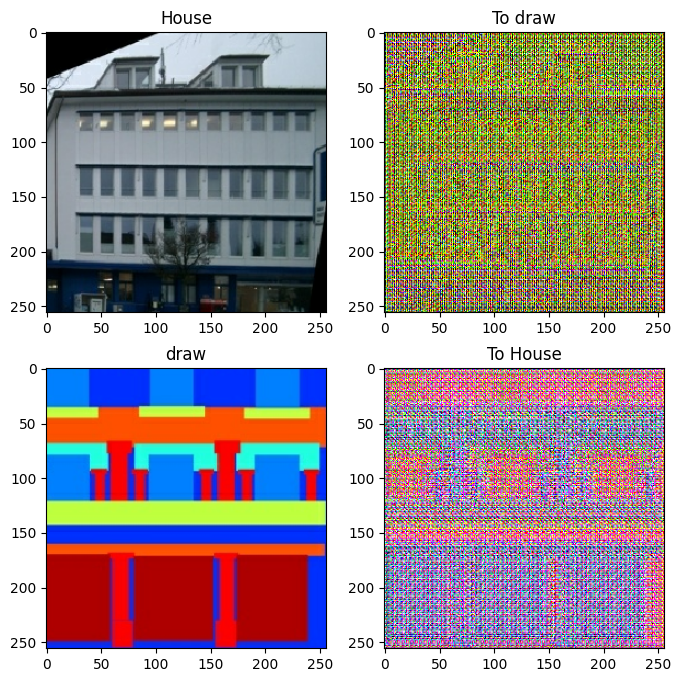

In [118]:
to_draw = generator_g(sample_real_house)
to_house = generator_f(sample_draw_house)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_real_house, to_draw, sample_draw_house, to_house]
title = ['House', 'To draw', 'draw', 'To House']

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5) # to increase contrast of the pixel values for better visualization
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

In [119]:
to_draw.shape


TensorShape([1, 256, 256, 3])

In [120]:
ntt = discriminator_y(sample_draw_house)
ntt.shape

TensorShape([1, 30, 30, 1])

In [121]:
#ntt

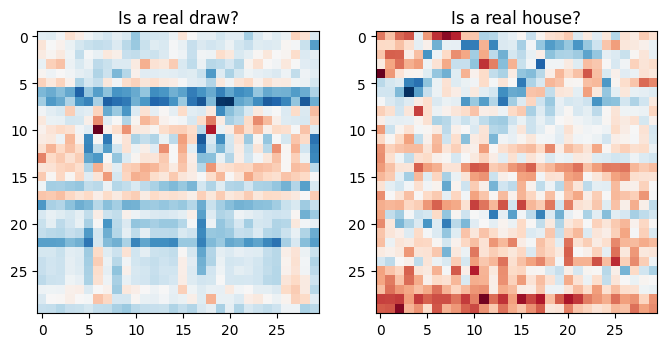

In [122]:
plt.figure(figsize=(8, 8))

plt.subplot(121)
plt.title('Is a real draw?')
plt.imshow(discriminator_y(sample_draw_house)[0, ..., -1], cmap='RdBu_r')

plt.subplot(122)
plt.title('Is a real house?')
plt.imshow(discriminator_x(sample_real_house)[0, ..., -1], cmap='RdBu_r')

# more dark red is more positive value while blue are negative
plt.show()

In [123]:
LAMBDA = 10
# since each pixel can be true class or not, we have binary classification at pixel level.
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [124]:
def discriminator_loss(real, generated):
  # Same as Adversarial discriminator loss, where discriminator will try to classify
  # real image as real when compared to 1's matrix.
  # And, classify generated image as fake by comparing with 0's matrix

  # This will be the loss than needs to be minimized w.r.t discriminator

  real_loss = loss_obj(tf.ones_like(real), real)

  generated_loss = loss_obj(tf.zeros_like(generated), generated)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

In [125]:
def generator_loss(generated):
  # Same as Adversarial generator loss, where generator will produce image called
  # generated image and discriminator will falsely classify it as real image and thus
  # generated image will be compared with 1's matrix to minimize loss.
  return loss_obj(tf.ones_like(generated), generated)

In [126]:
# Cycle consistency means the result should be close to the original input.
# For example, if one translates a sentence from English to French, and then translates
# it back from French to English, then the resulting sentence should be the same
# as the original sentence.

# Here, hyperparamter Lambda controls the relative importance of various loss terms

# In cycle consistency loss,

# 1. Image X is passed via generator G that yields generated image Y.
# 2. Generated image Y is passed via generator F that yields cycled image X.
# 3. Mean absolute error is calculated between real X and cycled X.
#  real X -> G(X) -> Y -> F(Y) -> cycled X

def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

  return LAMBDA * loss1

In [127]:
# Accourding to Identity preservation, we also calculate Identity loss.
# If you run the real-to-architecture house model on a real house or the
# architecture-to-real house model on a architecture house, it should not modify
# the image much since the image already contains the target class.

def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * 0.5 * loss

In [128]:
# define the optimizers
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [129]:
# Fault Tolerance using Checkpoint during training
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

In [130]:
# EPOCHS has been kept small as it needs very high computation power.
# The generated images will have much lower quality.
EPOCHS = 15

In [131]:
# Generating images from trained model
def generate_images(model, test_input):
  prediction = model(test_input)

  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [132]:
# per epoch training step as per concept of CycleGAN
@tf.function
def single_training_step(real_x, real_y):

  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
  with tf.GradientTape(persistent=True) as tape:
    # Generator losses part

    # X -> G(X) -> Y^ (generated)
    # Y -> F(Y) -> X^
    generated_y = generator_g(real_x, training=True)
    generated_x = generator_f(real_y, training=True)

    # Y^ -> F(Y^) -> X* (cycled)
    # X^ -> G(X^) -> Y*
    cycled_x = generator_f(generated_y, training=True)
    cycled_y = generator_g(generated_x, training=True)

    # X -> F(X) -> X~ (identity)
    # Y -> G(Y) -> Y~
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    identity_loss_x = identity_loss(real_x, same_x) # gen_F loss
    identity_loss_y = identity_loss(real_y, same_y) # gen_G loss

    cycled_loss_x = calc_cycle_loss(real_x, cycled_x) # Both gen_F & gen_G loss
    cycled_loss_y = calc_cycle_loss(real_y, cycled_y) # Both gen_F & gen_G loss

    generator_loss_x = generator_loss(generated_x) # gen_F loss
    generator_loss_y = generator_loss(generated_y) # gen_G loss

    # discriminator losses part

    # Applying discriminator for X & X^
    disc_real_x = discriminator_x(real_x, training=True)
    disc_generated_x = discriminator_x (generated_x, training=True)

    # Applying discriminator for Y and Y^
    disc_real_y = discriminator_y(real_y, training=True)
    disc_generated_y = discriminator_y(generated_y, training=True)

    # Calculate Loss of discriminator on real and generated X & Y
    disc_loss_x = discriminator_loss(disc_real_x, disc_generated_x)
    disc_loss_y = discriminator_loss(disc_real_y, disc_generated_y)

    # calculate losses for applying gradient and update on trainable parameters
    total_cycle_loss = cycled_loss_x + cycled_loss_y

    # genrator_G_loss
    gen_G_loss = identity_loss_y + total_cycle_loss + generator_loss_y

    # genrator_F_loss
    gen_F_loss = identity_loss_x + total_cycle_loss + generator_loss_x

    # calculate gradients
    gen_G_grad = tape.gradient(gen_G_loss, generator_g.trainable_variables)

    gen_F_grad = tape.gradient(gen_F_loss, generator_f.trainable_variables)

    disc_x_grad = tape.gradient(disc_loss_x, discriminator_x.trainable_variables)

    disc_y_grad = tape.gradient(disc_loss_y, discriminator_y.trainable_variables)

    # Apply gradients to update weights
    generator_g_optimizer.apply_gradients(zip(gen_G_grad, generator_g.trainable_variables))

    generator_f_optimizer.apply_gradients(zip(gen_F_grad, generator_f.trainable_variables))

    discriminator_x_optimizer.apply_gradients(zip(disc_x_grad, discriminator_x.trainable_variables))

    discriminator_y_optimizer.apply_gradients(zip(disc_y_grad, discriminator_y.trainable_variables))

    return gen_G_loss, gen_F_loss, total_cycle_loss



In [133]:
# per epoch training step as per concept of CycleGAN

@tf.function
def train_step(real_x, real_y):

  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
  with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y
    # Generator F translates Y -> X.

    fake_y = generator_g(real_x, training=True)
    cycled_x = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_y = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    # calculate the loss
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)

    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

  # Calculate the gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss,
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss,
                                        generator_f.trainable_variables)

  discriminator_x_gradients = tape.gradient(disc_x_loss,
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss,
                                            discriminator_y.trainable_variables)

  # Apply the gradients to the optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients,
                                            generator_g.trainable_variables))

  generator_f_optimizer.apply_gradients(zip(generator_f_gradients,
                                            generator_f.trainable_variables))

  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))

  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))

  return total_gen_g_loss, total_gen_f_loss, total_cycle_loss

starting training for epoch 0 : 


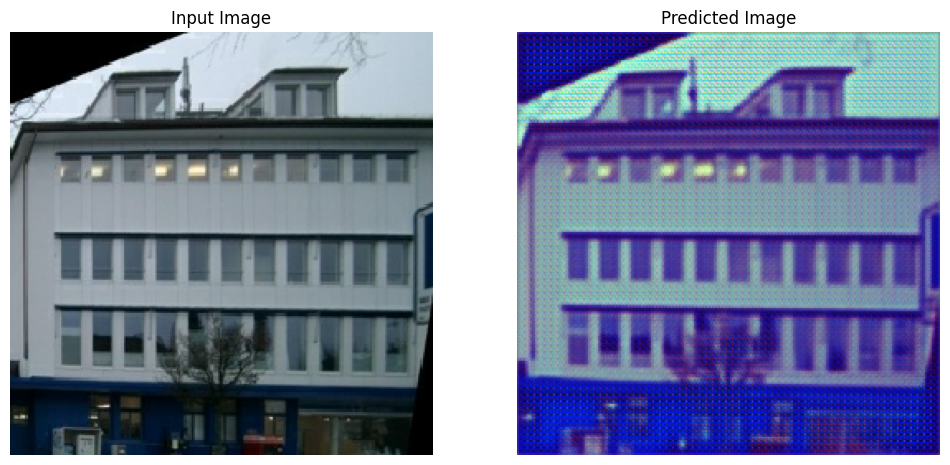

Time taken for epoch 1 is 217.68743014335632 sec




starting training for epoch 1 : 


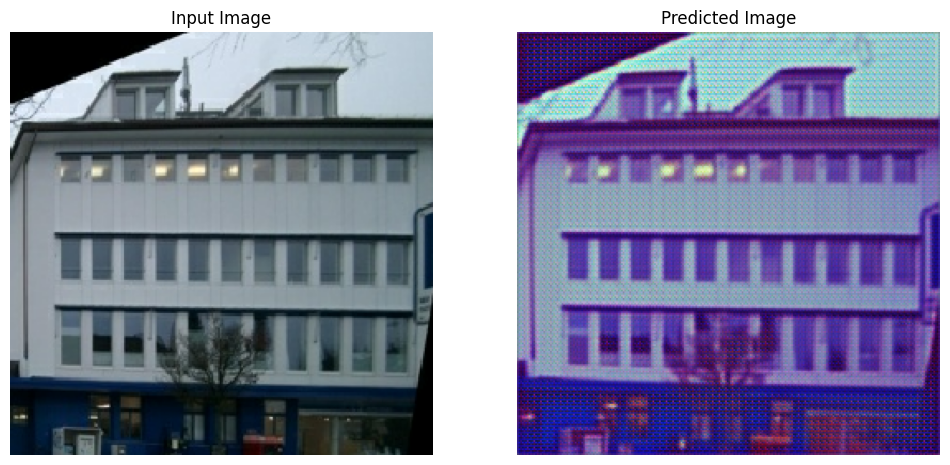

Time taken for epoch 2 is 164.7318878173828 sec




starting training for epoch 2 : 


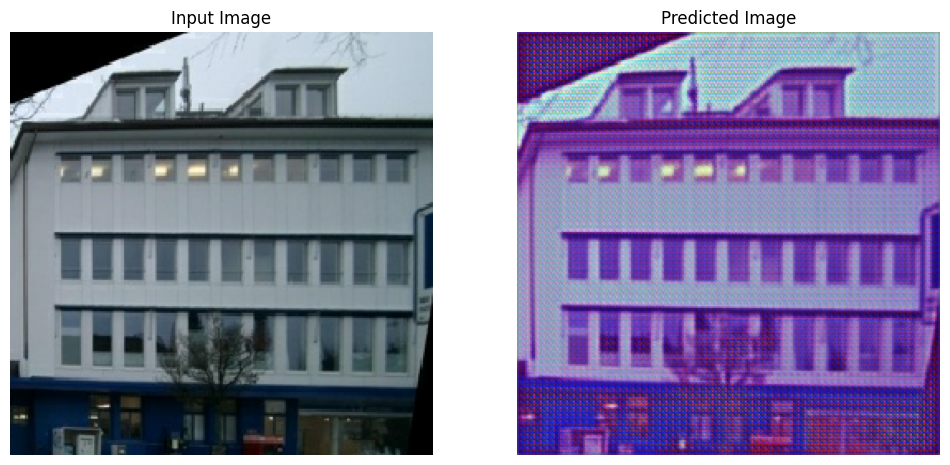

Time taken for epoch 3 is 164.6635708808899 sec




starting training for epoch 3 : 


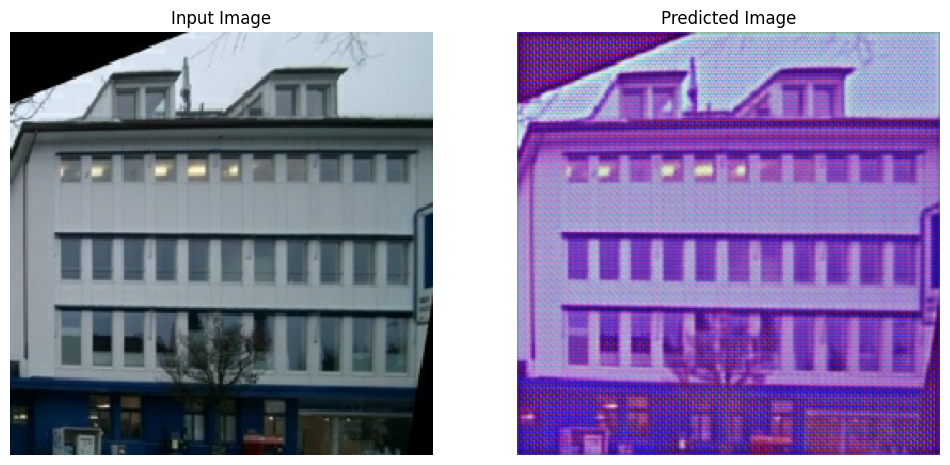

Time taken for epoch 4 is 164.75879859924316 sec




starting training for epoch 4 : 


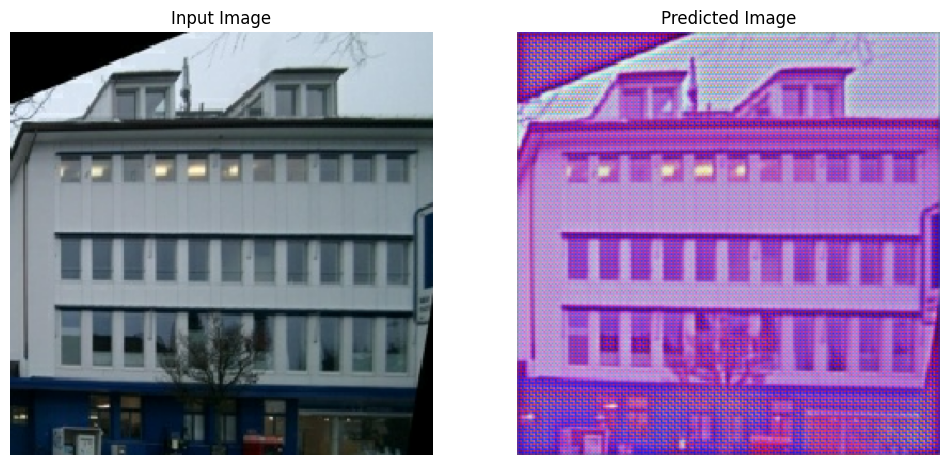

Saving checkpoint for epoch 5 
Time taken for epoch 5 is 164.63803386688232 sec




starting training for epoch 5 : 


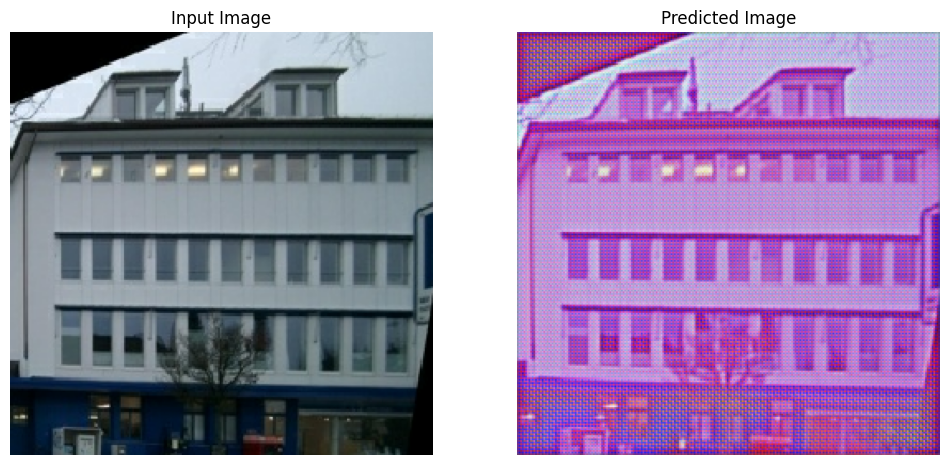

Time taken for epoch 6 is 164.7799108028412 sec




starting training for epoch 6 : 


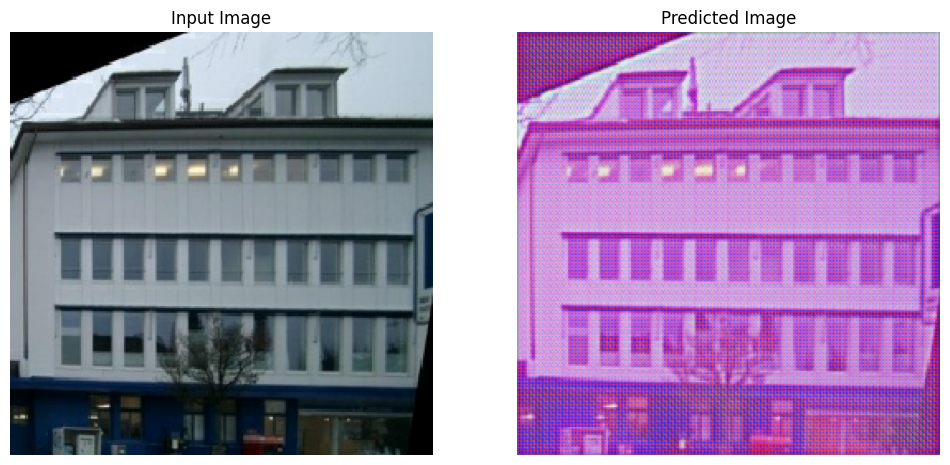

Time taken for epoch 7 is 164.64415860176086 sec




starting training for epoch 7 : 


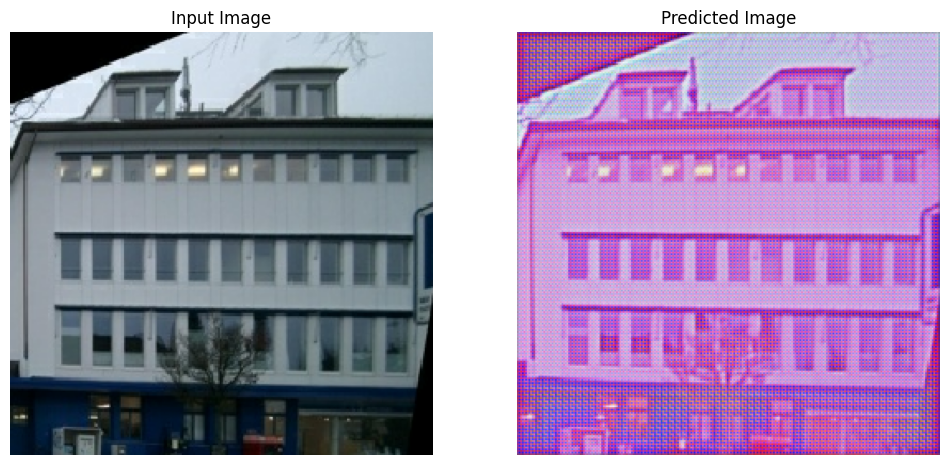

Time taken for epoch 8 is 164.80917406082153 sec




starting training for epoch 8 : 


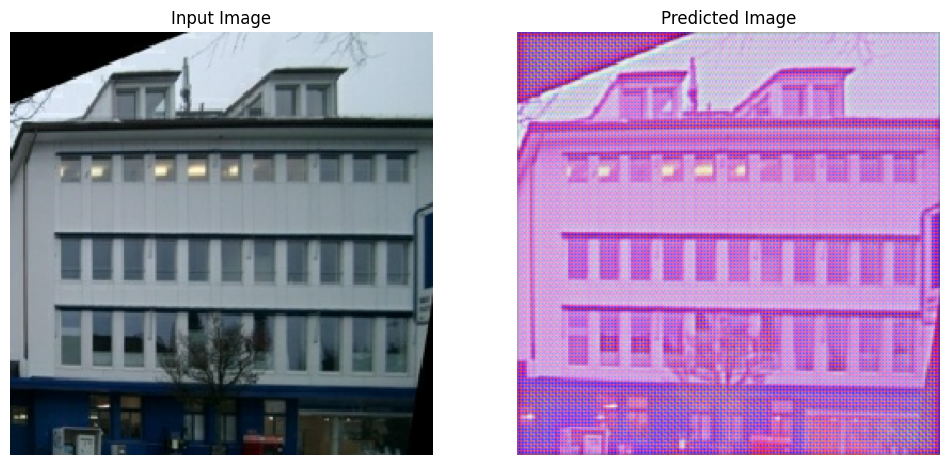

Time taken for epoch 9 is 202.9376847743988 sec




starting training for epoch 9 : 


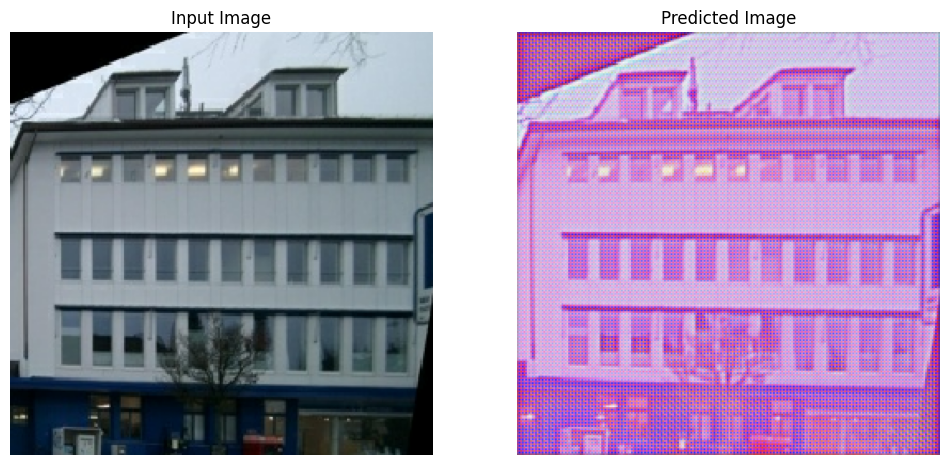

Saving checkpoint for epoch 10 
Time taken for epoch 10 is 164.77616047859192 sec




starting training for epoch 10 : 


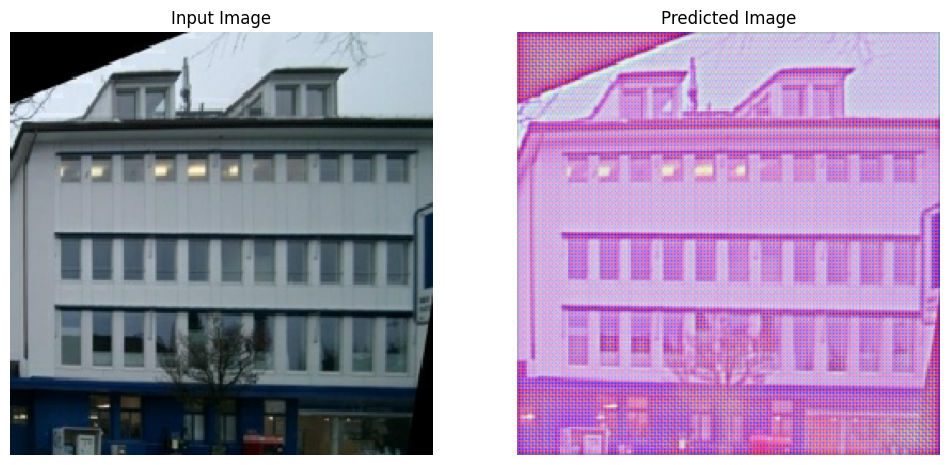

Time taken for epoch 11 is 164.61780452728271 sec




starting training for epoch 11 : 


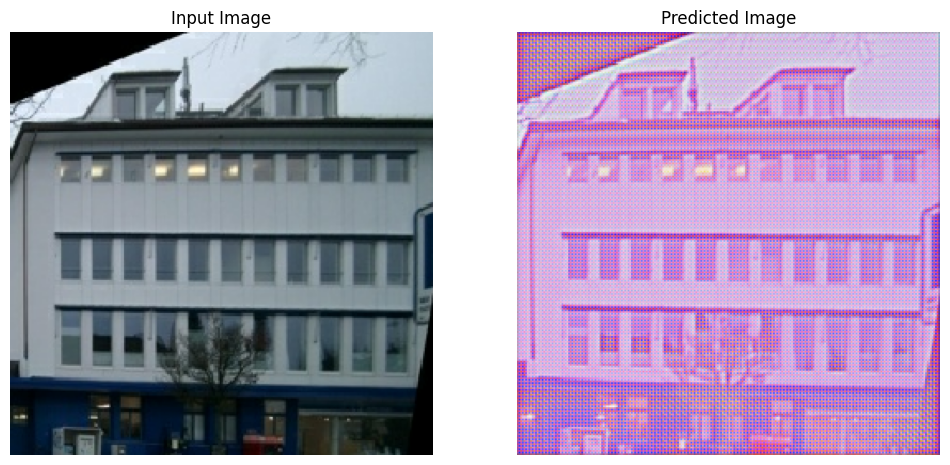

Time taken for epoch 12 is 164.47862124443054 sec




starting training for epoch 12 : 


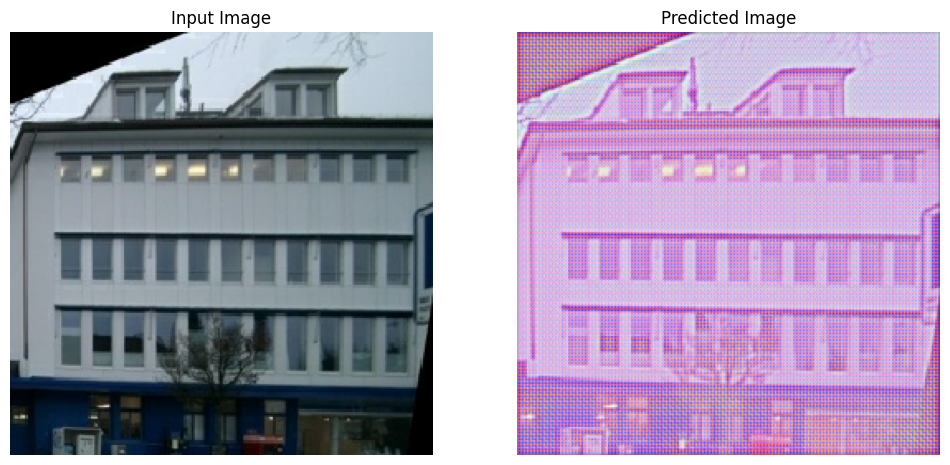

Time taken for epoch 13 is 164.6981327533722 sec




starting training for epoch 13 : 


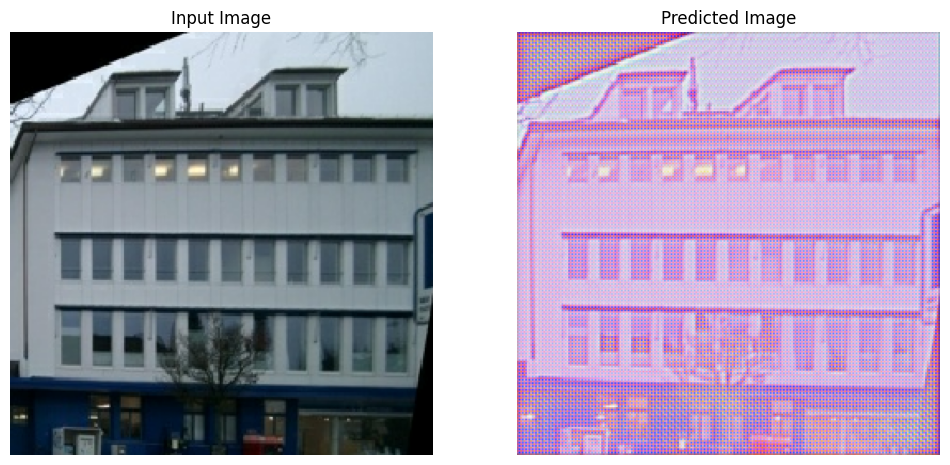

Time taken for epoch 14 is 164.68479228019714 sec




starting training for epoch 14 : 


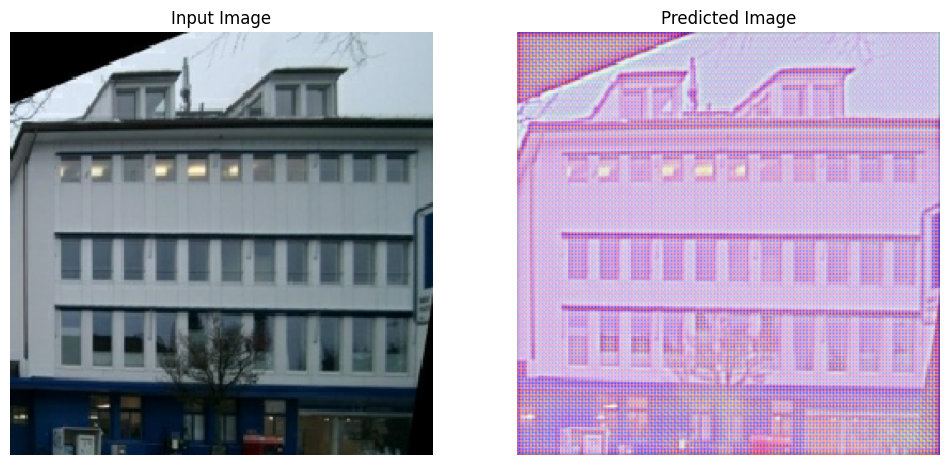

Saving checkpoint for epoch 15 
Time taken for epoch 15 is 164.5702085494995 sec






In [134]:
# running training loops over training datasets
gen_G_loss_list = []
gen_F_loss_list = []
cycle_loss_list = []

for epoch in range(EPOCHS):
  start = time.time()

  n = 0
  print('starting training for epoch {} : \n'.format(epoch))
  for image_x, image_y in tf.data.Dataset.zip((train_houses_real, train_houses_draw)):
    # running training step
    gen_G_losses, gen_F_losses, cycle_losses = single_training_step(image_x, image_y)

    # save losses per Epochs
    gen_G_loss_list.append(gen_G_losses)
    gen_F_loss_list.append(gen_F_losses)
    cycle_loss_list.append(cycle_loss_list)

    # show progress of training
    if n % 10 == 0:
      print ('=', end='')
    n += 1

  #clear_output(wait=True)

  # Using a consistent image (sample_real_house) so that the progress of the model
  # is clearly visible.
  generate_images(generator_g, sample_real_house)

  if (epoch + 1) % 5 == 0:
    #ckpt_save_path = ckpt_manager.save()
    print ('Saving checkpoint for epoch {} '.format(epoch+1))

  print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                      time.time()-start))
  print("\n\n")

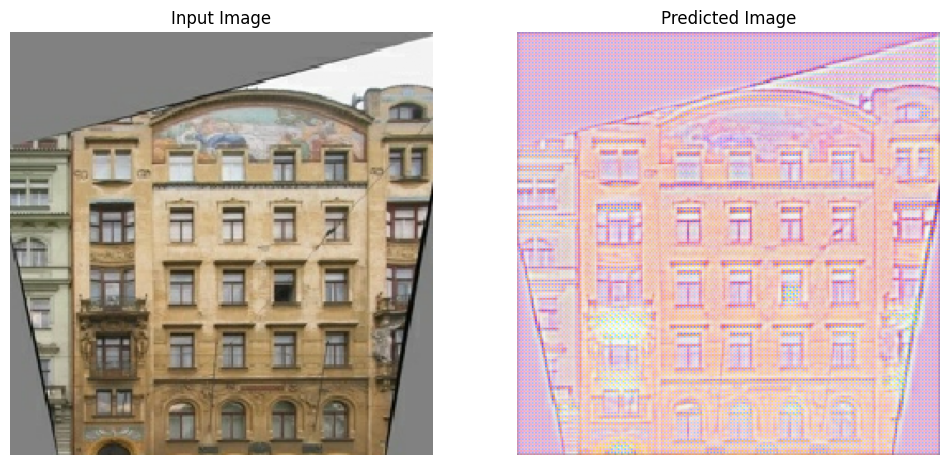

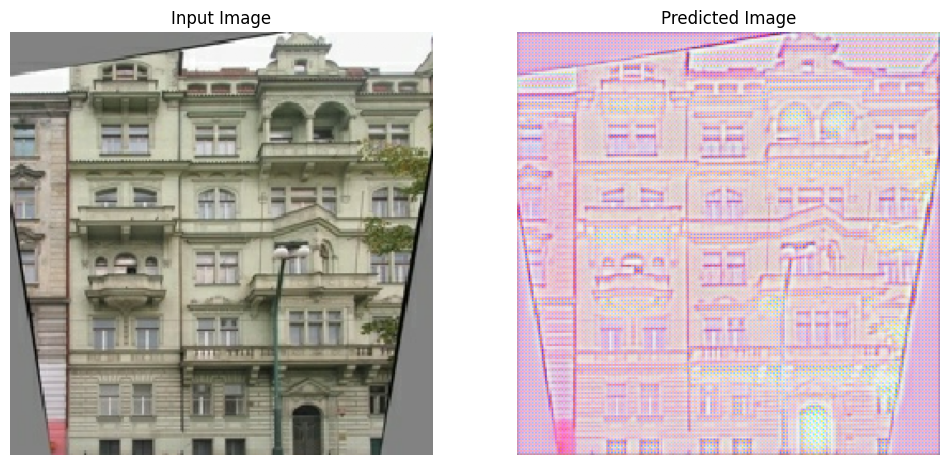

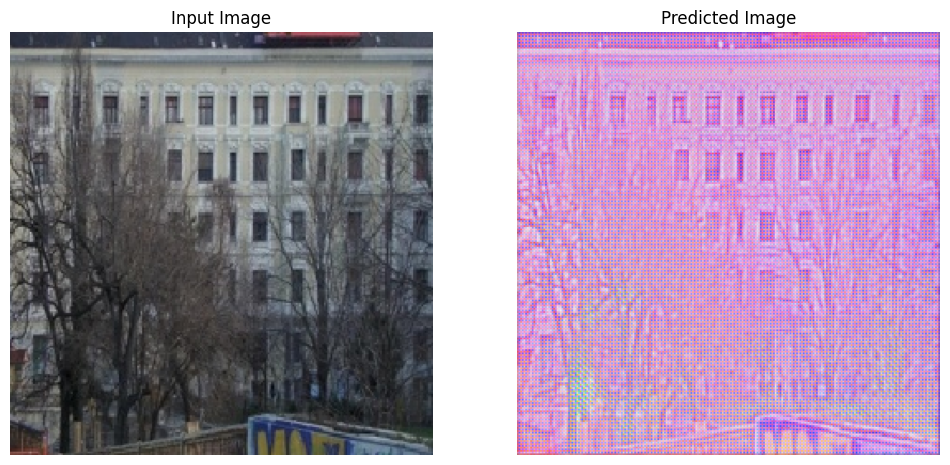

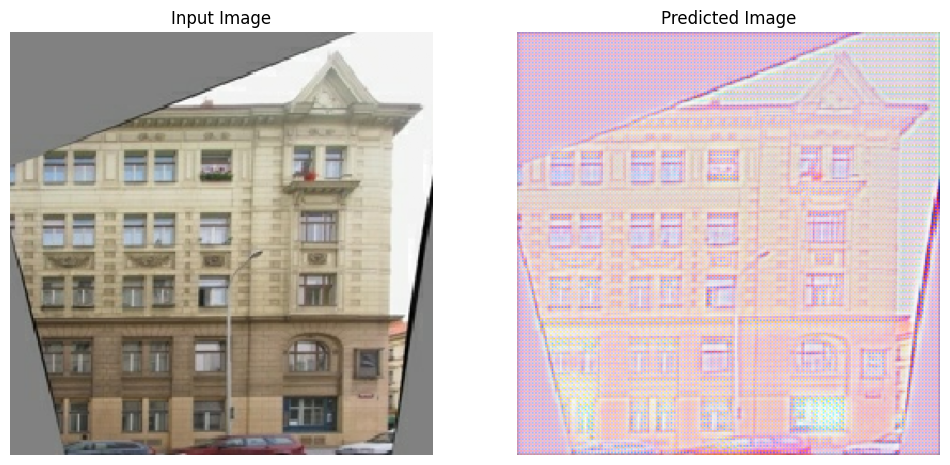

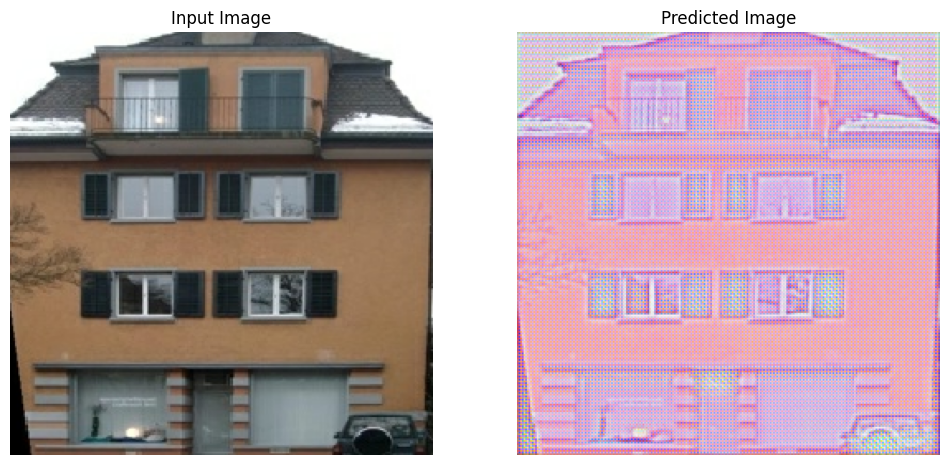

In [135]:
# Predicting image generation of trained style transferring model
for imgs in train_houses_real.take(5):
  generate_images(generator_g, imgs)

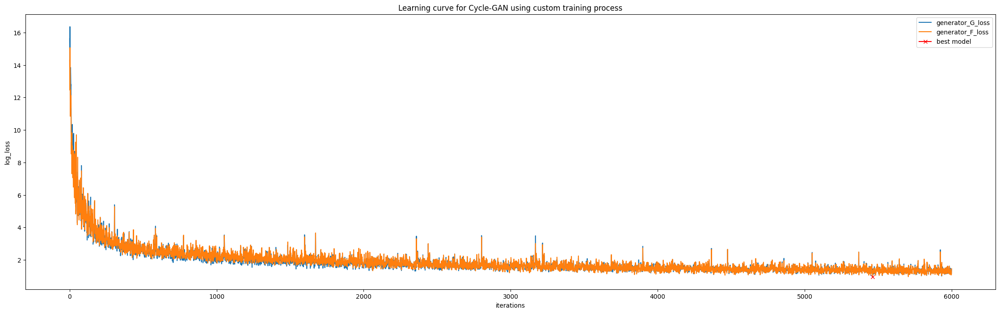

In [138]:
# Plotting Loss per epochs for model learning
import numpy as np
plt.figure(figsize=(28, 8))
plt.title("Learning curve for Cycle-GAN using custom training process")
plt.plot(gen_G_loss_list, label="generator_G_loss")
plt.plot(gen_F_loss_list, label="generator_F_loss")
plt.plot( np.argmin(gen_G_loss_list), np.min(gen_F_loss_list), marker="x", color="r", label="best model")
plt.xlabel("iterations")
plt.ylabel("log_loss")
plt.legend()